# Task 1

---

## Web scraping and analysis

This Jupyter notebook includes some code to get you started with web scraping. We will use a package called `BeautifulSoup` to collect the data from the web. Once you've collected your data and saved it into a local `.csv` file you should start with your analysis.

### Scraping data from Skytrax

If you visit [https://www.airlinequality.com] you can see that there is a lot of data there. For this task, we are only interested in reviews related to British Airways and the Airline itself.

If you navigate to this link: [https://www.airlinequality.com/airline-reviews/british-airways] you will see this data. Now, we can use `Python` and `BeautifulSoup` to collect all the links to the reviews and then to collect the text data on each of the individual review links.

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

In [ ]:
base_url = "https://www.airlinequality.com/airline-reviews/british-airways"
pages = 10
page_size = 100

reviews = []

# for i in range(1, pages + 1):
for i in range(1, pages + 1):

    print(f"Scraping page {i}")

    # Create URL to collect links from paginated data
    url = f"{base_url}/page/{i}/?sortby=post_date%3ADesc&pagesize={page_size}"

    # Collect HTML data from this page
    response = requests.get(url)

    # Parse content
    content = response.content
    parsed_content = BeautifulSoup(content, 'html.parser')
    for para in parsed_content.find_all("div", {"class": "text_content"}):
        reviews.append(para.get_text())

    print(f"   ---> {len(reviews)} total reviews")

Scraping page 1
   ---> 100 total reviews
Scraping page 2
   ---> 200 total reviews
Scraping page 3
   ---> 300 total reviews
Scraping page 4
   ---> 400 total reviews
Scraping page 5
   ---> 500 total reviews
Scraping page 6
   ---> 600 total reviews
Scraping page 7
   ---> 700 total reviews
Scraping page 8
   ---> 800 total reviews
Scraping page 9
   ---> 900 total reviews
Scraping page 10
   ---> 1000 total reviews


In [ ]:
df = pd.DataFrame()
df["reviews"] = reviews
df

,reviews
0,Not Verified | You can buy sandwiches and cris...
1,✅ Trip Verified | This is a two-for-one revie...
2,✅ Trip Verified | Absolutely horrible airline....
3,✅ Trip Verified | Having experienced delays a...
4,✅ Trip Verified | Travelled to Heathrow to Kal...
...,...
995,✅ Trip Verified | San Francisco to London Hea...
996,✅ Trip Verified | London to Dublin. This was ...
997,✅ Trip Verified | London to Paris. I wish tha...
998,✅ Trip Verified | Delivering outstanding cust...


In [ ]:
df.to_csv("C:\\Users\\vakit\\Desktop\\data\\BA_reviews.csv", index=False)

##Data Cleaning

The loops above collected 1000 reviews by iterating through the paginated pages on the website. However, if you want to collect more data, try increasing the number of pages!

 The next thing that you should do is clean this data to remove any unnecessary text from each of the rows. For example, "✅ Trip Verified" can be removed from each row if it exists, as it's not relevant to what we want to investigate.

In [ ]:
df["reviews"]=df["reviews"].str.replace("✅ Trip Verified", " ")
df["reviews"]=df["reviews"].str.replace("Not Verified", " ")
df["reviews"]=df["reviews"].str.replace("|", "")

df

<ipython-input-29-4f8dd8b32916>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df["reviews"]=df["reviews"].str.replace("|", "")


,reviews
0,You can buy sandwiches and crisps but don't...
1,This is a two-for-one review covering econ...
2,Absolutely horrible airline. Communication ...
3,Having experienced delays and cancellation...
4,Travelled to Heathrow to Kalamata and retur...
...,...
995,San Francisco to London Heathrow on the lo...
996,London to Dublin. This was an early mornin...
997,London to Paris. I wish that they would up...
998,Delivering outstanding customer service on...


When working with purely text data in a DataFrame column, there are several common cleaning techniques you can perform to preprocess and prepare the text for analysis. Some of the typical cleaning tasks for text data include:

Removing punctuation: Eliminating any punctuation marks from the text, such as periods, commas, and quotation marks.

Converting to lowercase: Changing all text to lowercase to ensure consistent handling of words regardless of their capitalization.

Removing stopwords: Removing common words that do not carry much meaning or contribute to the overall analysis, such as articles, prepositions, and conjunctions.

Removing numbers: Eliminating numeric characters from the text if they are not relevant to the analysis or context.

Tokenization: Splitting the text into individual words or tokens, allowing for further analysis on a word-by-word basis.

Lemmatization or stemming: Reducing words to their base or root form to handle variations like plurals or different verb tenses. Lemmatization considers the word's context, while stemming uses simpler rule-based methods.

Removing HTML tags or special characters: If your text data includes HTML tags or special characters, you may need to remove them to focus on the actual textual content.

Handling whitespace: Managing extra spaces or leading/trailing whitespace in the text.

These cleaning techniques help normalize and preprocess text data, making it more suitable for analysis tasks like sentiment analysis, topic modeling, or natural language processing.

To implement the cleaning techniques mentioned for the df["reviews"] column containing text data, we can use various Python libraries such as Pandas, NLTK (Natural Language Toolkit), and regular expressions (re).

In [ ]:
import nltk
nltk.download('punkt')
import re

df['reviews'] = df['reviews'].astype(str)

# Remove punctuation
df['reviews'] = df['reviews'].apply(lambda x: re.sub(r'[^\w\s]', '', x))

# Convert to lowercase
df['reviews'] = df['reviews'].str.lower()

# Tokenization
df['reviews'] = df['reviews'].apply(lambda x: nltk.word_tokenize(x))


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
# Remove stopwords
stopwords = set(nltk.corpus.stopwords.words('english'))
df['reviews'] = df['reviews'].apply(lambda x: [word for word in x if word not in stopwords])

# Lemmatization
nltk.download('wordnet')
lemmatizer = nltk.stem.WordNetLemmatizer()
df['reviews'] = df['reviews'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])

# Remove numbers
df['reviews'] = df['reviews'].apply(lambda x: [word for word in x if not word.isdigit()])

# Join tokens back into a single string
df['reviews'] = df['reviews'].apply(lambda x: ' '.join(x))

# Display the cleaned text column
print(df['reviews'])


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


0      buy sandwich crisp dont expect hot meal plane ...
1      twoforone review covering economy business cla...
2      absolutely horrible airline communication terr...
3      experienced delay cancellation departing usa e...
4      travelled heathrow kalamata return journey day...
                             ...                        
995    san francisco london heathrow lower deck a380 ...
996    london dublin early morning departure heathrow...
997    london paris wish would update aircraft perhap...
998    delivering outstanding customer service onboar...
999    night flight new york jfk london difficult ass...
Name: reviews, Length: 1000, dtype: object


##Insight Extraction

After performing the necessary text cleaning on your DataFrame column, you can extract insights from the cleaned text data using various techniques like:

1. Word frequency analysis
2. N-grams analysis
3. Sentiment analysis
4. Text summarization

In [ ]:
#word frequency analysis by tokenization

from nltk.tokenize import word_tokenize
from collections import Counter

# Tokenize the cleaned text
df['tokens'] = df['reviews'].apply(word_tokenize)

# Count the frequency of each word
word_counts = Counter([word for tokens in df['tokens'] for word in tokens])

# Get the most common words
most_common_words = word_counts.most_common(10)

most_common_words

[('flight', 2059),
 ('ba', 1131),
 ('seat', 927),
 ('service', 754),
 ('london', 610),
 ('time', 593),
 ('hour', 515),
 ('crew', 486),
 ('food', 475),
 ('one', 431)]

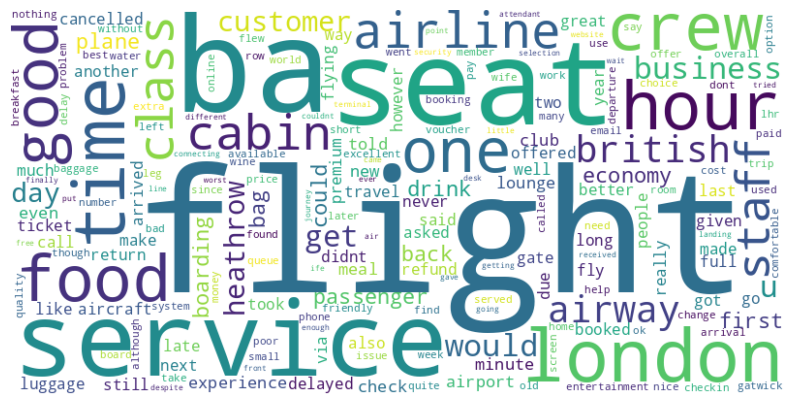

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Generate word frequency
word_freq = df['reviews'].str.split(expand=True).stack().value_counts()

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Plot word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


This is not enough to determine what adjectives are being used the most. Let us instead find the combination of words used most frequently through N-grams analysis.

In [ ]:
from nltk import ngrams

# Extract bi-grams from the cleaned text
df['bi_grams'] = df['reviews'].apply(lambda x: list(ngrams(x.split(), 2)))

# Count the frequency of each bi-gram
bi_gram_counts = Counter([bi_gram for tokens in df['bi_grams'] for bi_gram in tokens])

# Get the most common bi-grams
most_common_bi_grams = bi_gram_counts.most_common(10)

# Extract tri-grams from the cleaned text
df['tri_grams'] = df['reviews'].apply(lambda x: list(ngrams(x.split(), 3)))

# Count the frequency of each tri-gram
tri_gram_counts = Counter([tri_gram for tokens in df['tri_grams'] for tri_gram in tokens])

# Get the most common tri-grams
most_common_tri_grams = tri_gram_counts.most_common(10)

most_common_tri_grams

[(('business', 'class', 'seat'), 23),
 (('ba', 'customer', 'service'), 19),
 (('fly', 'british', 'airway'), 16),
 (('business', 'class', 'passenger'), 15),
 (('business', 'class', 'ticket'), 15),
 (('missed', 'connecting', 'flight'), 13),
 (('long', 'haul', 'flight'), 12),
 (('short', 'haul', 'flight'), 12),
 (('ba', 'business', 'class'), 12),
 (('flight', 'british', 'airway'), 12)]

Looks like bad customer service and missed connecting flights are a commonly occuring thing!

Let us use sentiment analysis to see how the overall sentiment for British

---

Airways is:

In [ ]:
#sentiment analysis

from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

# Initialize sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Calculate sentiment scores for each text entry
df['sentiment_scores'] = df['reviews'].apply(lambda x: sia.polarity_scores(x))

# Extract sentiment scores from dictionaries
df['sentiment_scores'] = df['sentiment_scores'].apply(lambda x: x['compound'])

# Get average sentiment scores
average_sentiment = df['sentiment_scores'].mean()

average_sentiment


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


0.1971288

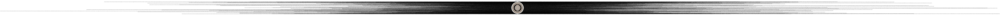

In [ ]:
# Count sentiment labels
sentiment_counts = df['reviews'].value_counts()

# Plot sentiment analysis
plt.figure(figsize=(6, 6))
plt.pie(sentiment_counts.values, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Sentiment Analysis')
plt.show()


The sentiment score typically ranges between -1 and 1, where negative values indicate negative sentiment, positive values indicate positive sentiment, and 0 represents neutral sentiment.

In this case, the average sentiment score of 0.1975864 suggests that, on average, the reviews in your dataset lean towards positive sentiment.

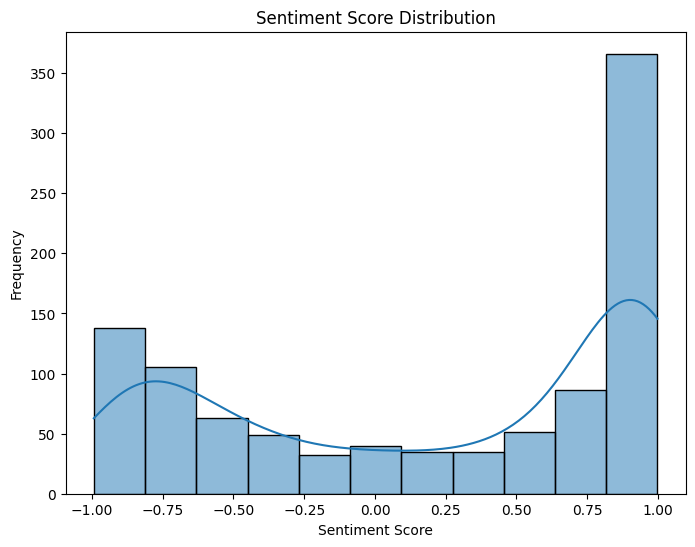

In [ ]:
import seaborn as sns

# Assuming you have a list of sentiment scores called 'sentiment_scores'
plt.figure(figsize=(8, 6))
sns.histplot(df['sentiment_scores'], kde=True)
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Sentiment Score Distribution')
plt.show()


Now let us try to summarise these reviews:

In [ ]:
!pip install sumy

from sumy.parsers.plaintext import PlaintextParser
from sumy.nlp.tokenizers import Tokenizer
from sumy.summarizers.lex_rank import LexRankSummarizer

# Set up the summarizer
summarizer = LexRankSummarizer()
summarizer.stop_words = ['english']  # Set the language for stop words

# Function to generate summary using Sumy
def get_summary(text, summarizer):
    parser = PlaintextParser.from_string(text, Tokenizer('english'))
    summary = summarizer(parser.document, sentences_count=2)  # Generate 2-sentence summary
    return ' '.join(str(sentence) for sentence in summary)

# Generate summaries for the cleaned text
df['summaries'] = df['reviews'].apply(lambda x: get_summary(x, summarizer))

# Get the summaries for further analysis
summaries = df['summaries'].tolist()


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
summaries=pd.DataFrame(summaries)
summaries

,0
0,buy sandwich crisp dont expect hot meal plane ...
1,twoforone review covering economy business cla...
2,absolutely horrible airline communication terr...
3,experienced delay cancellation departing usa e...
4,travelled heathrow kalamata return journey day...
...,...
995,san francisco london heathrow lower deck a380 ...
996,london dublin early morning departure heathrow...
997,london paris wish would update aircraft perhap...
998,delivering outstanding customer service onboar...
